### CS102 - Further Computing

Mark Howard<br>
School of Mathematical & Statistical Sciences<br>
NUI Galway<br>
mark.howard@nuigalway.ie

* Next Time: Recap of CS102 - Further Computing

### 4. Aspects of Machine Learning


Today: Finishing our overview of ML
#### Unsupervised Learning
1. Dimensionality reduction (PCA)
2. Clustering

#### Hot Topics in ML


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [11, 8] #This is just changing default size in Jupyter NB
plt.rcParams['figure.dpi'] = 100 # Ditto

#### Unsupervised Learning:

* Unsupervised learning can highlight interesting aspects of the data **without reference to any known labels**

For example: 

* **Dimensionality reduction** is the process of expressing high-dimensional data in a reduced number of dimensions such that each one contains the most amount of information. 
* Dimensionality reduction may be used for 
    * visualization of high-dimensional data, or 
    * speeding up machine learning models by removing low-information or correlated features.


#### Principal component analysis 
* Principal component analysis (PCA) is perhaps one of the most broadly used unsupervised algorithms. 
* PCA is fundamentally a **dimensionality reduction** algorithm, but it can also be useful as a tool for visualization, for noise filtering, for feature extraction and engineering.
* PCA is a popular method of reducing the dimensionality of data by drawing several orthogonal (perpendicular) vectors in the feature space to represent the reduced number of dimensions.


In [ ]:
# Plot some noisy data with a ~linear realtionship
rng = np.random.RandomState(1);
X = np.dot(rng.rand(2, 2), rng.randn(2, 200)).T;
plt.scatter(X[:, 0], X[:, 1]);
plt.axis('equal');
plt.show()

In [ ]:
# helper function
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->',
                    linewidth=2,
                    shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2);
pca.fit(X)

In [ ]:
plt.rcParams['figure.figsize'] = [10, 8] #This is just changing default size in Jupyter NB
# plot data alongside the principal components
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
for length, vector in zip(pca.explained_variance_, -pca.components_):
    v = vector * 3 * np.sqrt(length);draw_vector(pca.mean_, pca.mean_ + v)    
plt.axis('equal');

* These vectors represent the principal axes of the data, 
* the length of the vector is an indication of how "important" that axis is in describing the distribution of the data—
    * more precisely, the length is a measure of the variance of the data when projected onto that axis. 

The `pca.explained_variance_ratio_` parameter returns a vector of the variance explained by each dimension.

In [ ]:
pca.explained_variance_ratio_

In [ ]:
print('Cumulative sums=',pca.explained_variance_ratio_.cumsum())
np.sum(np.array([0.97634101, 0.02365899]))

* We see that (roughly speaking) 97.6% of the information is cointained in the first principal component

In [ ]:
pca = PCA(n_components=1)# Only use component
pca.fit(X)
X_pca = pca.transform(X)
X_new = pca.inverse_transform(X_pca)
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.8)
plt.axis('equal');



The light blue points are the original data, while the orange points are the projected version. 

This makes clear what a PCA dimensionality reduction means: the **information along the least important principal axis or axes is removed**, leaving only the information along the most important axis or axes.

This reduced-dimension dataset (in this case a 1-dimensional line) is in some senses "good enough" to encode the most important relationships between the points: despite reducing the dimension of the data by 50% (from 2-d to 1-d)

Let's revisit the Iris dataset for a less trivial example

In [ ]:
# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/iris.csv"
names = ['sepal-length', 'sepal-width', 'petal-length', 'petal-width', 'class']
dataset = pd.read_csv(url, names=names)
dataset.head()

PCA works on numerical data so let's split the dataset into X (numeric features) and y (the categories)

In [ ]:
X = dataset.drop(['class'],axis=1)
y = dataset['class']
X.head()

PCA is affected by scale so you should scale the features in your data before applying PCA. 
* Use StandardScaler to standardize the dataset’s features onto unit scale (mean = 0 and variance = 1),or
* Use MinMaxScaler to scale all the data features in the range [0, 1] or else in the range [-1, 1] if there are negative values in the dataset.

In [ ]:
from sklearn.preprocessing import StandardScaler
X = pd.DataFrame(StandardScaler().fit_transform(dataset.drop(['class'],axis=1)),columns = X.columns)
print(X['sepal-length'].mean())
print(X['sepal-length'].std())
X.head()

In [ ]:
from sklearn.preprocessing import MinMaxScaler
X = pd.DataFrame(MinMaxScaler().fit_transform(dataset.drop(['class'],axis=1)),columns = X.columns)
print(X['sepal-length'].min())
print(X['sepal-length'].max())
X.head()

You can satisfy yourself that it's just a simple rescaling of the original Iris dataset

In [ ]:
dataset.head()

* If we do not specify the number of components `n_components` it will return as many perperpendicular vectors as there are features in the dataset. 
* The components are sorted by `explained_variance_` (which you can think of as "importance").

In [ ]:
pca = PCA()#Get all the principal components, ordered by importance
X_new = pca.fit_transform(X)#fit_transform does .fit then .transform
X_new=pd.DataFrame(X_new,columns = ["Feature %d"%i for i in range(1,5)])#Make X_new into a dataframe
X_new.head()

The `explained_variance_ratio_` is simply the `explained_variance_` of each of our principal components, divided by the total `explained_variance_`.

In [ ]:

print('\n');print('pca.explained_variance_ratio_=',pca.explained_variance_ratio_)

print('\n');print('Cumulative sums=',pca.explained_variance_ratio_.cumsum())

This suggests that we can get to the essence of our data by using only the first 1 or 2 principal components 

We observe that principal components are orthogonal/perpendicular to each other, as advertised

In [ ]:
#The initial features in the dataset
corrmat = X.corr()
sns.heatmap(corrmat, annot = True, square = True);

In [ ]:
# The transformed features
corrmat_new = X_new.corr()
sns.heatmap(corrmat_new, annot = True, square = True);

This is what we expect to see for a dataset that has been transformed to its prinicipal components because principal components are orthogonal vectors.

What are the "arrows" for this Iris example?

In [ ]:
print(pca.components_)

In [ ]:
#Trying to decipher the meaning of the principal components 
print("Meaning of the 4 components:")
for component in pca.components_:
    print("\nPrincipal Component=",component)
    print( " + ".join("%.2f x %s" % (value, name) for value, name in zip(component, dataset.columns)))

Using PCA to simplify a ML model:
* Recall that the cumulative `explained_variance_ratio` using two components was about 95%. 
* This justifies us in keeping just the first two principal components (and ignoring the remaining two).

In [ ]:
sns.scatterplot(data=X_new, x="Feature 1", y="Feature 2",hue=dataset['class']);

* We see that the principal components show clear separation between the three output classes.
* Remember we are doing unsupervised learning so the model does not know the classes.
* We can go one step further and add in the third principal component (although we expect the gains from doing this to be small)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
axes = Axes3D(fig)
ax = fig.gca(projection='3d')
axes.set_title('Iris Dataset by PCA', size=14)
axes.set_xlabel('Feature 1')
axes.set_ylabel('Feature 2')
axes.set_zlabel('Feature 3')
axes.w_xaxis.set_ticklabels(())
axes.w_yaxis.set_ticklabels(())
axes.w_zaxis.set_ticklabels(())
axes.scatter(X_new['Feature 1'],X_new['Feature 2'],X_new['Feature 3'], c=np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]));
ax.view_init(azim=270, elev=90)#This matches the sns scatterplot from above

In [ ]:
ax.view_init(azim=80, elev=15)
display(fig)

Even keeping just one principal axis does a fairly good job!

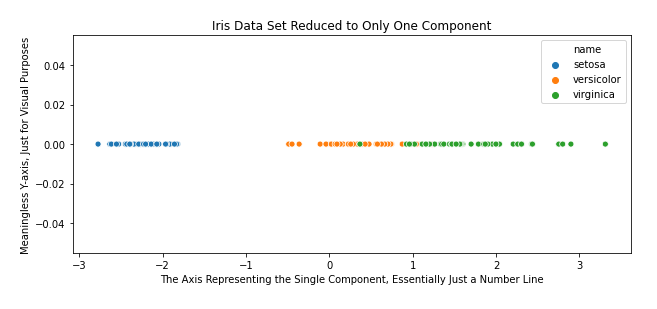

Hopefully, this example gets across the power of PCA when applied to huge datasets with very many features.

#### Clustering algorithms
Here we will move on to another class of unsupervised machine learning models: clustering algorithms. 

* Clustering algorithms seek to learn, from the properties of the data, an optimal division or discrete labeling of groups of points.

In [ ]:
%matplotlib inline
sns.set()  # for plot styling
#helper function
from sklearn.datasets.samples_generator import make_blobs
X, y_true = make_blobs(n_samples=300, centers=4,
                       cluster_std=0.60, random_state=0)

In [ ]:
# A scatter plot with ~4 blobs
plt.scatter(X[:, 0], X[:, 1], s=50);

* We can see, by eye, that this data naturally clusters into 4 distinct blobs. 
* The question is how to automate this, in a way that also works for more complex examples

Several approaches to clustering exist. Each approach is best suited to a particular data distribution. 

* Should consider whether the algorithm scales to your dataset. (Datasets ~m/billions),
* Not all clustering algorithms scale efficiently. Many work by computing the similarity between all pairs of datapoints.
* Their runtime increases as the square of the number of datapoints $n$, denoted as $\mathcal{O}(n^2)$ in complexity notation.
* $\mathcal{O}(n^2)$ algorithms are not practical when the number of datapoints are in m/billions.

###### Two major approaches in clustering

Centroid based methods: 
 - in which the clusters are formed by the **closeness of data points to the centroid** of clusters.

Density based Models: 
 - In which there is searching of data space for areas of the **varied density of data points** in the data space. 


K-Means Clustering may be the most widely known clustering algorithm and involves assigning datapoints to clusters in an effort to minimize the variance within each cluster.

* The k-means algorithm searches for a pre-determined number of clusters within an unlabeled multidimensional dataset. 
* It accomplishes this using a simple conception of what the optimal clustering looks like:
    * The "cluster center" is the arithmetic mean of all the points belonging to the cluster.
    * Each point is closer to its own cluster center than to other cluster centers.
    

The K-means algorithm starts with a first group of randomly selected centroids, which are used as the beginning points for every cluster, and then performs iterative (repetitive) calculations to optimize the positions of the centroids
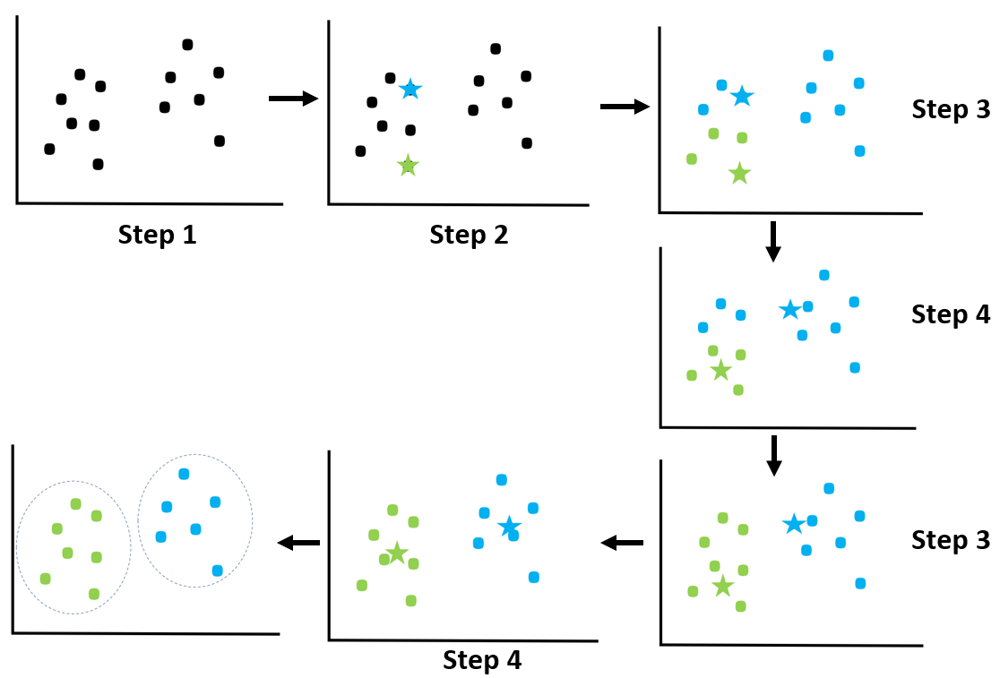
It halts creating and optimizing clusters when the centroids have stabilized:

In [ ]:
plt.rcParams['figure.figsize'] = [11, 8] #This is just changing default size in Jupyter NB
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);



A common challenge with k-means is that you must tell it how many clusters you expect: it cannot learn the number of clusters from the data. For example, if we ask the algorithm to identify six clusters, it will happily proceed and find the best six clusters:

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);


In [ ]:
#inertia = Sum of squared distances of samples to their closest cluster center
kmeans.inertia_

* Finding the optimal number of clusters is an important problem. 
* A commonly used method for this is the Elbow Method:  

    * We vary the number of clusters (K) and for each value of K, we calculate the inertia.
    * When we plot the inertia with the K value, the plot looks like an Elbow. 
    * At a certain number K, the graph starts to move almost parallel to the X-axis and this K value is an optimal number of clusters.

In [ ]:
res = list()
n_cluster = range(1,8)
for n in n_cluster:
    kmeans = KMeans(n_clusters=n)
    kmeans.fit(X)
    res.append(kmeans.inertia_)#inertia_ =Sum of squared distances of samples to their closest cluster center.


plt.plot(n_cluster, res)
plt.xticks(range(1,8))
plt.title('Elbow Curve');plt.ylabel('Inertia');plt.xlabel('no. of clusters')
plt.show()

Clustering via k-means is found to work well when the shape of the clusters is a circle in 2D, a sphere in 3D etc

In [ ]:
# A helper function to make moons
from sklearn.datasets import make_moons
X, y = make_moons(200, noise=.05, random_state=0)

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y,
            s=50, cmap='viridis');

How does K-means clustering perform on this?

In [ ]:
# Cluster using the K-means algorithm
labels = KMeans(2, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='viridis');

**Density-based clustering:**
* connects areas of high datapoint density into clusters. This allows for arbitrary-shaped distributions as long as dense areas can be connected. 

In scikit-learn we have DBSCAN, which stands for Density-based Spatial Clustering of Applications with Noise. One can sense from its name that, it divides the dataset into subgroup based on dense regions. DBSCAN does not require us to provide a number of clusters upfront.

In [ ]:
from sklearn.cluster import DBSCAN
X, y = make_moons(200, noise=.05, random_state=0)
db = DBSCAN(eps=0.2,
            min_samples=5,
            metric='euclidean')
y_pred = db.fit_predict(X)
f = plt.figure()
plt.scatter(X[:,0], X[:,1], s=50, c=y_pred, cmap='viridis')
plt.show()

In [ ]:
import time
import warnings

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

np.random.seed(0)

# ============
# Generate datasets. We choose the size big enough to see the scalability
# of the algorithms, but not too big to avoid too long running times
# ============
n_samples = 1500
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

# Anisotropicly distributed data
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# blobs with varied variances
varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

# ============
# Set up cluster parameters
# ============
plt.figure(figsize=(9 * 2 + 3, 13))
plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.01
)

plot_num = 1

default_base = {
    "quantile": 0.3,
    "eps": 0.3,
    "damping": 0.9,
    "preference": -200,
    "n_neighbors": 10,
    "n_clusters": 3,
    "min_samples": 20,
    "xi": 0.05,
    "min_cluster_size": 0.1,
}

datasets = [
    (
        noisy_circles,
        {
            "damping": 0.77,
            "preference": -240,
            "quantile": 0.2,
            "n_clusters": 2,
            "min_samples": 20,
            "xi": 0.25,
        },
    ),
    (noisy_moons, {"damping": 0.75, "preference": -220, "n_clusters": 2}),
    (
        varied,
        {
            "eps": 0.18,
            "n_neighbors": 2,
            "min_samples": 5,
            "xi": 0.035,
            "min_cluster_size": 0.2,
        },
    ),
    (
        aniso,
        {
            "eps": 0.15,
            "n_neighbors": 2,
            "min_samples": 20,
            "xi": 0.1,
            "min_cluster_size": 0.2,
        },
    ),
    (blobs, {}),
    (no_structure, {}),
]

for i_dataset, (dataset, algo_params) in enumerate(datasets):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)

    X, y = dataset

    # normalize dataset for easier parameter selection
    X = StandardScaler().fit_transform(X)

    # estimate bandwidth for mean shift
    bandwidth = cluster.estimate_bandwidth(X, quantile=params["quantile"])

    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(
        X, n_neighbors=params["n_neighbors"], include_self=False
    )
    # make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity.T)

    # ============
    # Create cluster objects
    # ============
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
    two_means = cluster.MiniBatchKMeans(n_clusters=params["n_clusters"])
    ward = cluster.AgglomerativeClustering(
        n_clusters=params["n_clusters"], linkage="ward", connectivity=connectivity
    )
    spectral = cluster.SpectralClustering(
        n_clusters=params["n_clusters"],
        eigen_solver="arpack",
        affinity="nearest_neighbors",
    )
    dbscan = cluster.DBSCAN(eps=params["eps"])
    optics = cluster.OPTICS(
        min_samples=params["min_samples"],
        xi=params["xi"],
        min_cluster_size=params["min_cluster_size"],
    )
    affinity_propagation = cluster.AffinityPropagation(
        damping=params["damping"], preference=params["preference"], random_state=0
    )
    average_linkage = cluster.AgglomerativeClustering(
        linkage="average",
        affinity="cityblock",
        n_clusters=params["n_clusters"],
        connectivity=connectivity,
    )
    birch = cluster.Birch(n_clusters=params["n_clusters"])
    gmm = mixture.GaussianMixture(
        n_components=params["n_clusters"], covariance_type="full"
    )

    clustering_algorithms = (
        ("MiniBatch\nKMeans", two_means),
        ("Affinity\nPropagation", affinity_propagation),
        ("MeanShift", ms),
        ("Spectral\nClustering", spectral),
        ("Ward", ward),
        ("Agglomerative\nClustering", average_linkage),
        ("DBSCAN", dbscan),
        ("OPTICS", optics),
        ("BIRCH", birch),
        ("Gaussian\nMixture", gmm),
    )

    for name, algorithm in clustering_algorithms:
        t0 = time.time()

        # catch warnings related to kneighbors_graph
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the "
                + "connectivity matrix is [0-9]{1,2}"
                + " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning,
            )
            warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding"
                + " may not work as expected.",
                category=UserWarning,
            )
            algorithm.fit(X)

        t1 = time.time()
        if hasattr(algorithm, "labels_"):
            y_pred = algorithm.labels_.astype(int)
        else:
            y_pred = algorithm.predict(X)

        plt.subplot(len(datasets), len(clustering_algorithms), plot_num)
        if i_dataset == 0:
            plt.title(name, size=18)

        colors = np.array(
            list(
                islice(
                    cycle(
                        [
                            "#377eb8",
                            "#ff7f00",
                            "#4daf4a",
                            "#f781bf",
                            "#a65628",
                            "#984ea3",
                            "#999999",
                            "#e41a1c",
                            "#dede00",
                        ]
                    ),
                    int(max(y_pred) + 1),
                )
            )
        )
        # add black color for outliers (if any)
        colors = np.append(colors, ["#000000"])
        plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[y_pred])

        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks(())
        plt.yticks(())
        plt.text(
            0.99,
            0.01,
            ("%.2fs" % (t1 - t0)).lstrip("0"),
            transform=plt.gca().transAxes,
            size=15,
            horizontalalignment="right",
        )
        plot_num += 1

plt.show()

#### Hot Topics in ML
#### Neural Networks

Neural Networks are implemented Scikit as the multilayer perceptron (MLP)

* Neural networks are a subset of machine learning and are at the heart of **deep learning algorithms.**
* Their **name and structure are inspired by the human brain**, mimicking the way that biological neurons signal to one another.

* A neural network is a set of "neurons" organized in layers. 
* Each neuron is a mathematical operation that takes its input, multiplies it by its weights and then passes the sum through to the other connected neurons. 
* A Neural network learns how to classify an input through adjusting its weights based on previous examples.


**The task** in this example is to predict the color of the points in the plot on the right (a classification problem).

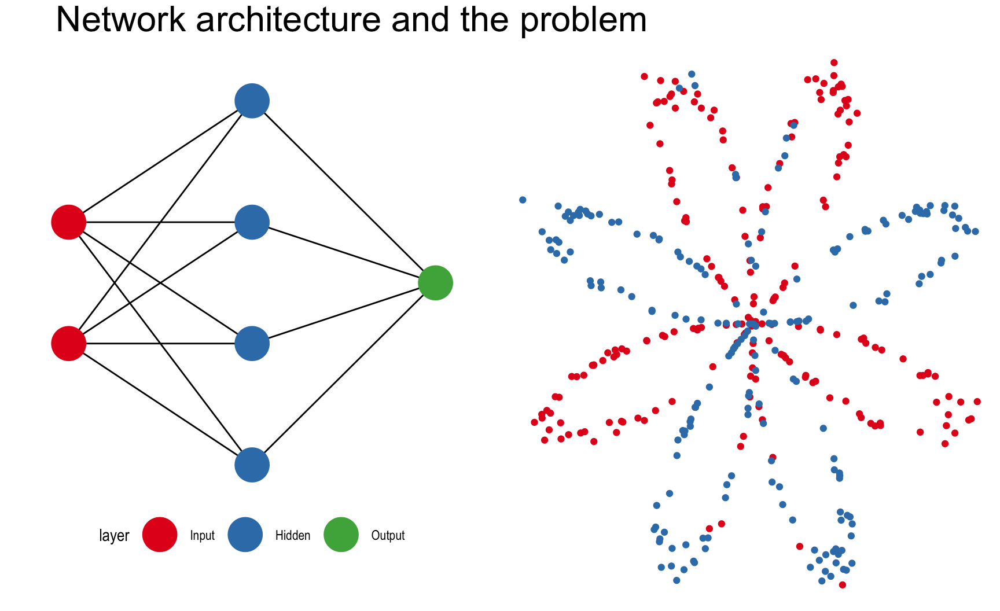

* Below is an animated example of a classification task being solved by a neural network.
* The numbers on the edges are weights and these are being updated at every iteration, based on how well the output is achieving its goal

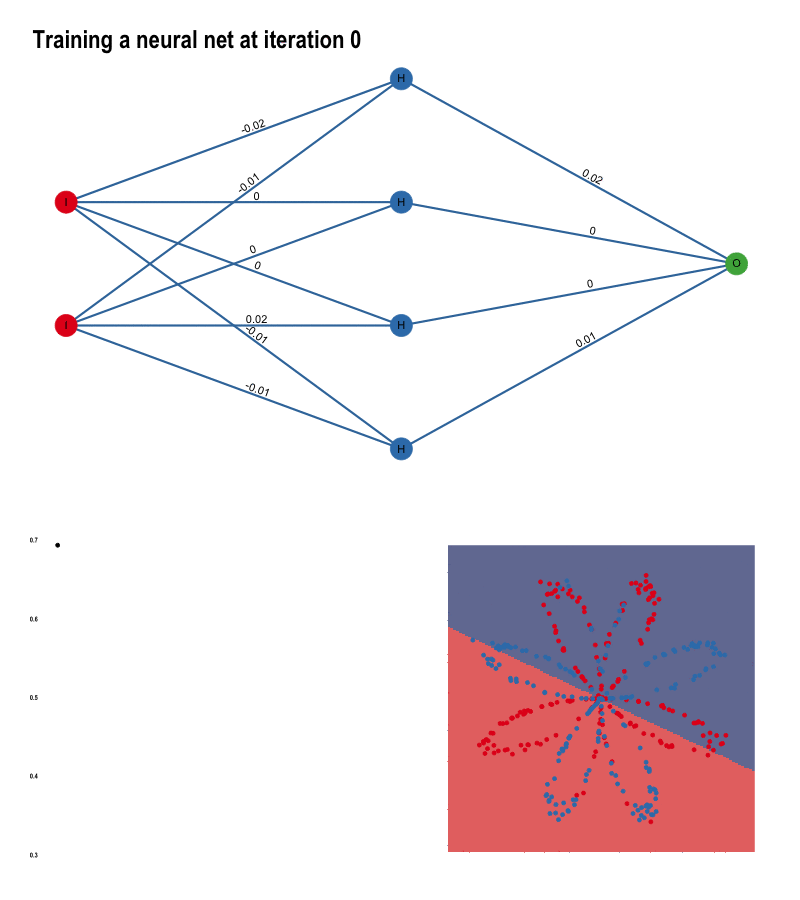

#### AlphaGo

* In March 2016, AlphaGo beat Lee Sedol in a five-game match, the first time a computer Go program has beaten a 9-dan professional without handicap. 
* The win by AlphaGo was chosen by Science as one of the Breakthrough of the Year runners-up in 2016.
* The computer programme that defeated the world Go champion taught itself (**using Deep Neural Networks**) how to improve its game by playing millions of matches against itself. 
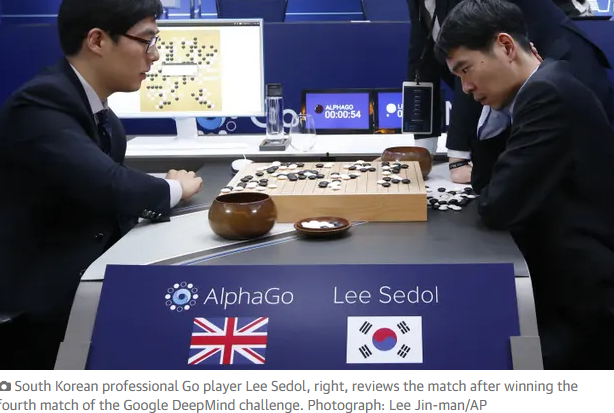

#### Generative Adversarial Networks (GANs)
[https://thispersondoesnotexist.com/](https://thispersondoesnotexist.com/) uses a [Generative Adversarial Network](https://en.wikipedia.org/wiki/Generative_adversarial_network). Similar techniques were also used to create the Tom Cruise "deepfakes" on TikTok.


Way back in 2014, Ian Goodfellow proposed a revolutionary idea: <br>
**make two neural networks compete with each other.**

* One neural network tries to **generate** realistic data,
* the other network tries to **discriminate** between real data and data generated by the generator network.

The generator network uses the discriminator as a loss function and updates its parameters to generate data that starts to look more realistic.

GANs are deep neural net architectures that consist of **two ML models pitted against each other (hence the name "adversarial").**

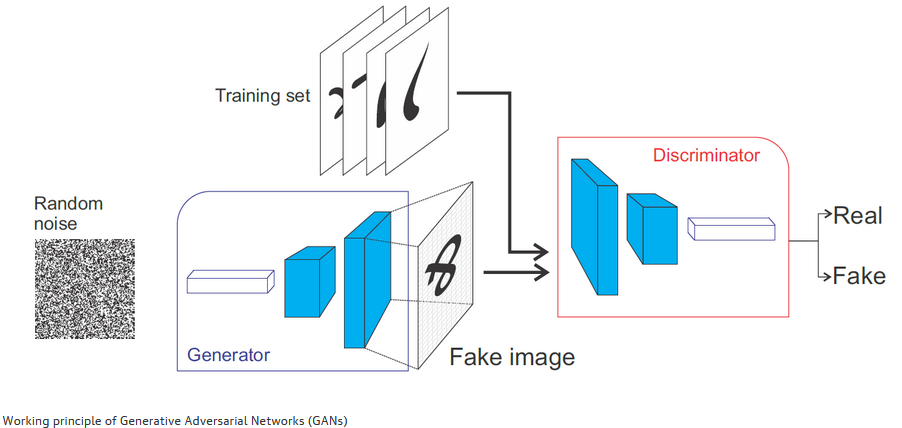

* The Generator will try to generate data samples out of a specific probability distribution, which is very similar to the actual object. 
* The discriminator will judge whether its input is coming from the original training set or from the generator

This type of process eventually gets very good at producing fakes!

#### To Recap
Supervised and unsupervised learning are examples of two different types of machine learning

**Supervised machine learning** is used to classify unseen data into established categories and forecast trends and future change as a predictive model.

* Classification
    - Spam detection as part of an email firewall. 
    - Identifying and classifying objects in an image file type. 
    - Speech recognition and facial recognition software. 
    - Automated classification of documents and writing. 
    - Analysing the sentiment of written language and messages. 
* Regression    
    - Forecast stock or trading outcomes and market fluctuations, a key role of machine learning in finance. 
    - Predict the success of marketing campaigns. 
    - Forecast changes in market value in sectors like retail or the housing market. 
    - Predict changes in health trends in a demographic or area. 





**Unsupervised machine learning** is the training of models on raw and unlabelled training data. It is often used to identify patterns and trends in raw datasets, or to cluster similar data into a specific number of groups.

* Clustering
* Visualization
* Dimensionality Reduction
* Recommender Systems